In [35]:
#Import de librerias basicas tablas y matrices
import numpy as np 
import pandas as pd 
import os

#Gradient Boosting
#import lightgbm as lgb

#Funciones auxiliares sklearn
#from sklearn.model_selection import train_test_split, StratifiedKFold #Split y cross Validation
#from sklearn.metrics import cohen_kappa_score, accuracy_score, balanced_accuracy_score #Metricas
#from sklearn.utils import shuffle
#from sklearn.pipeline import Pipeline
#from sklearn.preprocessing import OrdinalEncoder
#from sklearn.compose import ColumnTransformer
#from sklearn import set_config


#Visualizacióon
from plotly import express as px

#Plot de matriz de confusion normalizada en actuals
#from utils import plot_confusion_matrix



Lecturas de archivos

In [36]:
pathdata='data/'
filename1 = 'sell-in.txt'
filename2 = 'tb_productos.txt'


filepath = os.path.join(pathdata, filename1)
sell = pd.read_csv(filepath, sep="\t")


filepath = os.path.join(pathdata, filename2)
productos = pd.read_csv(filepath,sep="\t")


In [37]:
sell

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn
0,201701,10234,20524,0,2,0.05300,0.05300
1,201701,10032,20524,0,1,0.13628,0.13628
2,201701,10217,20524,0,1,0.03028,0.03028
3,201701,10125,20524,0,1,0.02271,0.02271
4,201701,10012,20524,0,11,1.54452,1.54452
...,...,...,...,...,...,...,...
2945813,201912,10105,20853,0,1,0.02230,0.02230
2945814,201912,10092,20853,0,1,0.00669,0.00669
2945815,201912,10006,20853,0,7,0.02898,0.02898
2945816,201912,10018,20853,0,4,0.01561,0.01561


In [38]:
productos

,cat1,cat2,cat3,brand,sku_size,product_id
0,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20280
1,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20180
2,HC,ROPA LAVADO,Liquido,LIMPIEX,120,20332
3,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20222
4,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20288
...,...,...,...,...,...,...
1257,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,12,20240
1258,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,6,20285
1259,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,2,20259
1260,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,12,20142


Unimos los datasets por producto

In [39]:
#Eliminamos productos duplicados ???
duplicados = productos[productos.duplicated('product_id', keep=False)]
print(duplicados.sort_values('product_id'))

      cat1            cat2            cat3     brand  sku_size  product_id
36      HC     ROPA LAVADO           Polvo   LIMPIEX       400       20010
37      HC     ROPA LAVADO           Polvo   LIMPIEX       400       20010
43      HC     ROPA LAVADO           Polvo   LIMPIEX       800       20020
44      HC     ROPA LAVADO           Polvo   LIMPIEX       800       20020
41      HC     ROPA LAVADO           Polvo   LIMPIEX       400       20021
42      HC     ROPA LAVADO           Polvo   LIMPIEX       400       20021
38      HC     ROPA LAVADO           Polvo   LIMPIEX       800       20022
39      HC     ROPA LAVADO           Polvo   LIMPIEX       800       20022
552  FOODS  SOPAS Y CALDOS      Caldo Cubo     MAGGI        12       20037
553  FOODS  SOPAS Y CALDOS      Caldo Cubo     MAGGI        12       20037
900  FOODS        ADEREZOS         Mostaza  MOSTAZA1        60       20100
898  FOODS        ADEREZOS         Mostaza  MOSTAZA1        60       20100
646  FOODS  SOPAS Y CALDO

In [40]:
productos_unicos = productos.drop_duplicates('product_id')

In [41]:
productos_unicos

,cat1,cat2,cat3,brand,sku_size,product_id
0,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20280
1,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20180
2,HC,ROPA LAVADO,Liquido,LIMPIEX,120,20332
3,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20222
4,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20288
...,...,...,...,...,...,...
1257,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,12,20240
1258,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,6,20285
1259,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,2,20259
1260,FOODS,SOPAS Y CALDOS,Caldo Cubo,MAGGI2,12,20142


In [42]:
df=pd.merge(sell,productos_unicos,on='product_id',how='left')

In [43]:
df

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,cat1,cat2,cat3,brand,sku_size
0,201701,10234,20524,0,2,0.05300,0.05300,HC,VAJILLA,Cristalino,Importado,500.0
1,201701,10032,20524,0,1,0.13628,0.13628,HC,VAJILLA,Cristalino,Importado,500.0
2,201701,10217,20524,0,1,0.03028,0.03028,HC,VAJILLA,Cristalino,Importado,500.0
3,201701,10125,20524,0,1,0.02271,0.02271,HC,VAJILLA,Cristalino,Importado,500.0
4,201701,10012,20524,0,11,1.54452,1.54452,HC,VAJILLA,Cristalino,Importado,500.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2945813,201912,10105,20853,0,1,0.02230,0.02230,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945814,201912,10092,20853,0,1,0.00669,0.00669,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945815,201912,10006,20853,0,7,0.02898,0.02898,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945816,201912,10018,20853,0,4,0.01561,0.01561,PC,CABELLO,Shampoo Bebe,NIVEA,200.0


In [ ]:
df.info()

cantidad de productos

In [44]:
df['product_id'].nunique()

1233

eliminar los productos a prueba solo datos los ultimos 3 meses

In [48]:
df

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,cat1,cat2,cat3,brand,sku_size
0,201701,10234,20524,0,2,0.05300,0.05300,HC,VAJILLA,Cristalino,Importado,500.0
1,201701,10032,20524,0,1,0.13628,0.13628,HC,VAJILLA,Cristalino,Importado,500.0
2,201701,10217,20524,0,1,0.03028,0.03028,HC,VAJILLA,Cristalino,Importado,500.0
3,201701,10125,20524,0,1,0.02271,0.02271,HC,VAJILLA,Cristalino,Importado,500.0
4,201701,10012,20524,0,11,1.54452,1.54452,HC,VAJILLA,Cristalino,Importado,500.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2945813,201912,10105,20853,0,1,0.02230,0.02230,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945814,201912,10092,20853,0,1,0.00669,0.00669,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945815,201912,10006,20853,0,7,0.02898,0.02898,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945816,201912,10018,20853,0,4,0.01561,0.01561,PC,CABELLO,Shampoo Bebe,NIVEA,200.0


In [50]:
df_agg = df.groupby(['periodo', 'product_id'], as_index=False).agg({
    'tn': 'sum'
})

In [51]:
df_agg

,periodo,product_id,tn
0,201701,20001,934.77222
1,201701,20002,550.15707
2,201701,20003,1063.45835
3,201701,20004,555.91614
4,201701,20005,494.27011
...,...,...,...
31238,201912,21265,0.05007
31239,201912,21266,0.05121
31240,201912,21267,0.01569
31241,201912,21271,0.00298


In [52]:
df_agg['periodo'] = pd.to_datetime(df_agg['periodo'].astype(str), format='%Y%m')
ultima_fecha = df_agg['periodo'].max()

# Calcular fecha umbral (3 meses antes de la última)
umbral = ultima_fecha - pd.DateOffset(months=3)

# Verificar si un producto tiene al menos un registro antes del umbral
productos_con_dato_previo = df_agg[df_agg['periodo'] < umbral]['product_id'].unique()
#df_sin = df[df['product_id'].isin(productos_con_dato_previo)].copy()

In [54]:
df_sin = df[df['product_id'].isin(productos_con_dato_previo)].copy()

In [55]:
df_sin['product_id'].nunique()

1181

productos discontinuados 6 meses sin ventas???

In [ ]:
# Calcular fecha umbral (3 meses antes de la última)
umbral = ultima_fecha - pd.DateOffset(months=6)

# Verificar si un producto tiene al menos un registro antes del umbral
productos_con_dato_previo = df_agg[df_agg['periodo'] > umbral]['product_id'].unique()
#df_sin = df[df['product_id'].isin(productos_con_dato_previo)].copy()
df_sin = df_sin[df_sin['product_id'].isin(productos_con_dato_previo)].copy()

In [60]:
df_sin = df_sin[df_sin['product_id'].isin(productos_con_dato_previo)].copy()

In [61]:
df_sin['product_id'].nunique()

953

In [62]:
df_sin

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,cat1,cat2,cat3,brand,sku_size
0,201701,10234,20524,0,2,0.05300,0.05300,HC,VAJILLA,Cristalino,Importado,500.0
1,201701,10032,20524,0,1,0.13628,0.13628,HC,VAJILLA,Cristalino,Importado,500.0
2,201701,10217,20524,0,1,0.03028,0.03028,HC,VAJILLA,Cristalino,Importado,500.0
3,201701,10125,20524,0,1,0.02271,0.02271,HC,VAJILLA,Cristalino,Importado,500.0
4,201701,10012,20524,0,11,1.54452,1.54452,HC,VAJILLA,Cristalino,Importado,500.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2945813,201912,10105,20853,0,1,0.02230,0.02230,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945814,201912,10092,20853,0,1,0.00669,0.00669,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945815,201912,10006,20853,0,7,0.02898,0.02898,PC,CABELLO,Shampoo Bebe,NIVEA,200.0
2945816,201912,10018,20853,0,4,0.01561,0.01561,PC,CABELLO,Shampoo Bebe,NIVEA,200.0


cantidad de clientes

In [ ]:
df['customer_id'].nunique()

In [63]:
import altair as alt

alt.data_transformers.disable_max_rows()

# Paso 1: Prepara los datos
df_agg = df_sin.groupby(['periodo', 'product_id'], as_index=False)['tn'].sum()
df_agg['periodo'] = pd.to_datetime(df_agg['periodo'].astype(str), format='%Y%m')

# Paso 2: Crea un parámetro interactivo
product_param = alt.param(
    name='product_id',  # <- IMPORTANTE: debe coincidir con el campo en el DataFrame
    bind=alt.binding_select(options=sorted(df_agg['product_id'].unique()), name='Producto: '),
    value=df_agg['product_id'].iloc[0]
)

# Paso 3: Aplica el filtro al gráfico
chart = alt.Chart(df_agg).mark_line().encode(
    x='periodo:T',
    y='tn:Q',
    tooltip=['periodo:T', 'tn', 'product_id']
).add_params(
    product_param
).transform_filter(
    'datum.product_id == product_id'  
).properties(
    width=700,
    height=400,
    title='Serie de tn por mes para producto seleccionado'
)

chart

alt.Chart(...)

In [64]:
ver=df_sin[df_sin['product_id'] == 21270]

In [65]:
ver

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,cat1,cat2,cat3,brand,sku_size
2628815,201908,10045,21270,0,1,0.81278,0.81278,NaN,NaN,NaN,NaN,NaN


In [67]:
# Contar la cantidad de meses únicos con ventas por producto
ventas_por_producto = df_sin.groupby('product_id')['periodo'].nunique()

# Productos con al menos 3 meses de ventas
productos_validos = ventas_por_producto[ventas_por_producto >= 3].index

# Filtrar el dataset original
df_filtrado = df[df['product_id'].isin(productos_validos)].copy()

In [68]:
ver=df_filtrado[df_filtrado['product_id'] == 21270]

In [71]:
df_filtrado['product_id'].nunique()

952

In [72]:
alt.data_transformers.disable_max_rows()

# Paso 1: Prepara los datos
df_agg = df_filtrado.groupby(['periodo', 'product_id'], as_index=False)['tn'].sum()
df_agg['periodo'] = pd.to_datetime(df_agg['periodo'].astype(str), format='%Y%m')

# Paso 2: Crea un parámetro interactivo
product_param = alt.param(
    name='product_id',  # <- IMPORTANTE: debe coincidir con el campo en el DataFrame
    bind=alt.binding_select(options=sorted(df_agg['product_id'].unique()), name='Producto: '),
    value=df_agg['product_id'].iloc[0]
)

# Paso 3: Aplica el filtro al gráfico
chart = alt.Chart(df_agg).mark_line().encode(
    x='periodo:T',
    y='tn:Q',
    tooltip=['periodo:T', 'tn', 'product_id']
).add_params(
    product_param
).transform_filter(
    'datum.product_id == product_id'  
).properties(
    width=700,
    height=400,
    title='Serie de tn por mes para producto seleccionado'
)

chart

alt.Chart(...)

In [73]:
df_agg = df_filtrado.groupby(['periodo', 'cat1'], as_index=False).agg({
    'tn': 'sum'
})

In [76]:
df_agg['periodo'] = pd.to_datetime(df_agg['periodo'].astype(str), format='%Y%m')

In [77]:
chart = alt.Chart(df_agg).mark_line().encode(
    x='periodo:T',
    y='tn:Q',
    color='cat1:N',
    tooltip=['periodo:T', 'cat1:N', 'tn:Q']
).properties(
    width=600,
    height=400,
    title='Series por cat1'
)

chart

c:\Users\abelf\AppData\Local\Programs\Python\Python311\Lib\site-packages\altair\utils\core.py:410: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

Vamos a trabajar por separado las 3 categorias

HC

In [78]:
df_filtrado_hc=df_filtrado[df_filtrado['cat1'] == 'HC']

In [81]:
df_filtrado_hc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 673953 entries, 0 to 2944928
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   periodo                673953 non-null  int64  
 1   customer_id            673953 non-null  int64  
 2   product_id             673953 non-null  int64  
 3   plan_precios_cuidados  673953 non-null  int64  
 4   cust_request_qty       673953 non-null  int64  
 5   cust_request_tn        673953 non-null  float64
 6   tn                     673953 non-null  float64
 7   cat1                   673953 non-null  object 
 8   cat2                   673953 non-null  object 
 9   cat3                   673953 non-null  object 
 10  brand                  673953 non-null  object 
 11  sku_size               673953 non-null  float64
dtypes: float64(3), int64(5), object(4)
memory usage: 66.8+ MB


In [84]:
df_agg = df_filtrado_hc.groupby(['customer_id'], as_index=False).agg({
    'tn': 'sum'
})

In [ ]:
tomo los mejores 50 clientes y luego los mejores 50 productos

In [88]:
df_ordenado = df_agg.sort_values(by='tn', ascending=False)

In [90]:
mejoresclientes=df_ordenado.head(50)

In [91]:
df_agg = df_filtrado_hc.groupby(['product_id'], as_index=False).agg({
    'tn': 'sum'
})
df_ordenado = df_agg.sort_values(by='tn', ascending=False)
mejoresproductos=df_ordenado.head(50)

In [92]:
mejoresproductos

,product_id,tn
0,20001,50340.39558
1,20002,36337.25439
3,20007,22018.45234
2,20006,21088.76007
4,20008,19948.29352
6,20010,18671.07918
8,20012,17813.59935
5,20009,16891.02429
10,20014,16177.73435
7,20011,16085.40570


FILTRAMOS HC POR LOS MEJORES 50 CLIENTES Y 50 PRODUCTOS

In [93]:
df_agg = df_filtrado_hc.groupby(['periodo', 'product_id','customer_id'], as_index=False).agg({
    'tn': 'sum'
})

In [94]:
df_agg['periodo'] = pd.to_datetime(df_agg['periodo'].astype(str), format='%Y%m')

In [95]:
df_agg

,periodo,product_id,customer_id,tn
0,2017-01-01,20001,10001,99.43861
1,2017-01-01,20001,10002,35.72806
2,2017-01-01,20001,10003,143.49426
3,2017-01-01,20001,10004,184.72927
4,2017-01-01,20001,10005,19.08407
...,...,...,...,...
673948,2019-12-01,21212,10311,0.00035
673949,2019-12-01,21212,10313,0.00069
673950,2019-12-01,21212,10378,0.00069
673951,2019-12-01,21212,10464,0.00104


In [96]:
df_filtrado = df_agg[df_agg['product_id'].isin(mejoresproductos['product_id'])]

In [97]:
df_filtrado = df_filtrado[df_filtrado['customer_id'].isin(mejoresclientes['customer_id'])]

In [98]:
df_filtrado

,periodo,product_id,customer_id,tn
0,2017-01-01,20001,10001,99.43861
1,2017-01-01,20001,10002,35.72806
2,2017-01-01,20001,10003,143.49426
3,2017-01-01,20001,10004,184.72927
4,2017-01-01,20001,10005,19.08407
...,...,...,...,...
664951,2019-12-01,20069,10041,0.83866
664952,2019-12-01,20069,10042,3.35462
664953,2019-12-01,20069,10043,1.67731
664954,2019-12-01,20069,10044,0.78624


In [99]:
# Desactivar el límite de filas en Altair
alt.data_transformers.disable_max_rows()

# Parámetro interactivo para seleccionar cliente
cliente_param = alt.param(
    name='cliente',
    bind=alt.binding_select(options=sorted(df_filtrado['customer_id'].unique()), name='Cliente: '),
    value=df_filtrado['customer_id'].iloc[0]  # valor por defecto
)

In [100]:
chart = alt.Chart(df_filtrado).mark_bar().encode(
    x=alt.X('periodo:T', title='Mes'),
    y=alt.Y('tn:Q', title='Toneladas'),
    color=alt.Color('product_id:N', title='Producto'),
    tooltip=['periodo:T', 'product_id:N', 'tn:Q']
).add_params(
    cliente_param
).transform_filter(
    'datum.customer_id == cliente'
).properties(
    width=700,
    height=400,
    title='Evolución mensual de compras por producto (cliente seleccionado)'
)

chart

alt.Chart(...)

In [101]:
df_filtrado.to_csv('modi/df_hc_mejores.csv', index=False)

Vamos a analizar una busqueda de patrones de compra

Frecuencia	¿Cada cuántos meses compra? ¿Compra todos los meses o saltea?
Volumen	¿Cuánto compra por mes? ¿Es constante o variable?
Diversidad	¿Compra muchos productos distintos o siempre los mismos?
Estacionalidad	¿Compra más en ciertos meses del año?
Persistencia	¿Cuántos meses seguidos se mantiene activo? ¿Tiene lapsos largos sin comprar?

In [102]:
# Sumar volumen por cliente y mes
cliente_mes = df_filtrado.groupby(['customer_id', 'periodo'])['tn'].sum().reset_index()

# Pivotear a matriz cliente x mes
cliente_mes_pivot = cliente_mes.pivot(index='customer_id', columns='periodo', values='tn').fillna(0)

In [103]:
cliente_mes_pivot

periodo,2017-01-01,2017-02-01,2017-03-01,2017-04-01,2017-05-01,2017-06-01,2017-07-01,2017-08-01,2017-09-01,2017-10-01,...,2019-03-01,2019-04-01,2019-05-01,2019-06-01,2019-07-01,2019-08-01,2019-09-01,2019-10-01,2019-11-01,2019-12-01
customer_id,,,,,,,,,,,,,,,,,,,,,
10001,1045.77931,1453.32574,1446.25533,1609.08751,1796.77265,1816.17481,1687.10753,1082.26109,2183.05635,1587.81030,...,1227.76540,1256.38285,1932.83635,779.91505,958.18902,628.49824,1033.27262,1371.91460,1502.74693,1246.03216
10002,1142.62981,143.56414,837.84054,1106.00414,1115.48841,1281.54374,1866.59836,345.59691,1735.52359,897.48584,...,1254.81642,1422.69016,1275.57582,1726.35584,1213.36683,58.42196,655.57416,1091.17088,528.65861,1316.97495
10003,891.92213,602.45951,1333.19820,825.25847,842.41479,930.89238,837.63032,734.36456,818.71192,855.34514,...,988.64555,794.83596,118.24842,397.96015,1095.02958,840.83871,908.15077,816.28876,395.08536,318.50623
10004,823.20799,767.20910,1167.18420,1017.73348,1033.91314,1018.26259,1241.33903,1079.34466,841.55242,1595.62635,...,604.18573,823.39749,847.43140,566.91280,598.26108,316.16973,816.43441,1259.55851,570.51518,384.61572
10005,448.64421,574.96510,939.79900,445.96419,1085.70936,984.10342,1139.85523,1104.29380,1423.36914,849.75107,...,544.08228,885.83115,537.22371,818.63652,520.75539,89.76759,987.40447,365.50737,394.82909,314.53873
10006,557.63698,599.98704,867.35466,843.33399,1081.97582,680.76050,904.45808,903.36101,553.91880,832.82275,...,725.31789,523.97853,553.87693,483.50650,484.15639,545.83743,657.32781,693.07930,878.65118,357.12713
10007,280.55041,360.65374,646.62656,492.60092,610.54950,593.79125,255.72606,454.11324,724.73998,755.73165,...,611.04675,443.97953,375.16887,485.96889,603.74618,594.41741,718.13359,698.91046,471.24112,417.76347
10008,608.43370,399.22014,591.28450,701.34481,742.87493,589.29770,473.15607,625.94062,706.30166,492.15827,...,582.98216,455.48181,309.99525,446.67956,454.95386,305.50866,657.89946,708.80123,322.82793,325.56109
10009,351.30074,312.83511,674.41141,534.75543,633.36768,506.47220,495.74316,800.51720,605.67144,641.85674,...,353.55965,487.42524,416.74771,364.42294,422.05702,576.98791,485.81187,485.06069,410.55323,153.56696


In [104]:
#Estandarizamos por distintos volumenes

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(cliente_mes_pivot)

In [105]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=42)
cliente_mes_pivot['cluster'] = kmeans.fit_predict(X_scaled)

Clientes diferentes en volumen

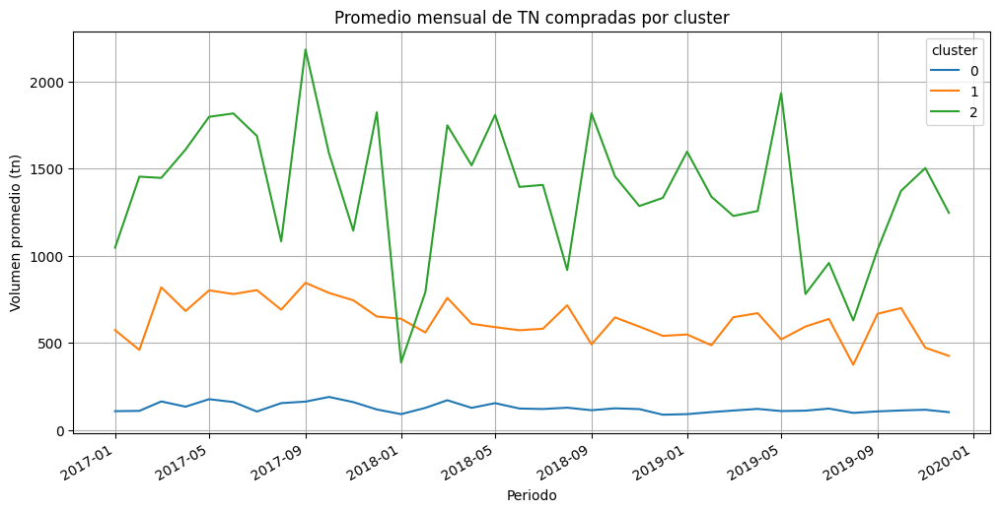

In [106]:
import matplotlib.pyplot as plt

cliente_mes_pivot.drop('cluster', axis=1).groupby(cliente_mes_pivot['cluster']).mean().T.plot(figsize=(12, 6))
plt.title("Promedio mensual de TN compradas por cluster")
plt.xlabel("Periodo")
plt.ylabel("Volumen promedio (tn)")
plt.grid(True)
plt.show()

Cluster 2 (línea verde)
Compran mucho en volumen (TN) respecto a los demás.

Tienen picos estacionales marcados, posiblemente por campaña agrícola.

Son clientes importantes por volumen y con comportamiento cíclico.

Cluster 1 (línea naranja)
Volumen medio.

Patrón más estable, menos variabilidad que el cluster verde.

Puede representar clientes de tamaño medio o con demanda más constante.

Cluster 0 (línea azul)
Volumen muy bajo y bastante plano.

Posiblemente clientes pequeños o esporádicos.

Podrían tener menos relevancia comercial.

In [107]:
cliente_mes_pivot['cluster'].value_counts()

cluster
0    39
1    10
2     1
Name: count, dtype: int64

In [111]:
cliente_mes_pivot

periodo,2017-01-01 00:00:00,2017-02-01 00:00:00,2017-03-01 00:00:00,2017-04-01 00:00:00,2017-05-01 00:00:00,2017-06-01 00:00:00,2017-07-01 00:00:00,2017-08-01 00:00:00,2017-09-01 00:00:00,2017-10-01 00:00:00,...,2019-04-01 00:00:00,2019-05-01 00:00:00,2019-06-01 00:00:00,2019-07-01 00:00:00,2019-08-01 00:00:00,2019-09-01 00:00:00,2019-10-01 00:00:00,2019-11-01 00:00:00,2019-12-01 00:00:00,cluster
customer_id,,,,,,,,,,,,,,,,,,,,,
10001,1045.77931,1453.32574,1446.25533,1609.08751,1796.77265,1816.17481,1687.10753,1082.26109,2183.05635,1587.81030,...,1256.38285,1932.83635,779.91505,958.18902,628.49824,1033.27262,1371.91460,1502.74693,1246.03216,2
10002,1142.62981,143.56414,837.84054,1106.00414,1115.48841,1281.54374,1866.59836,345.59691,1735.52359,897.48584,...,1422.69016,1275.57582,1726.35584,1213.36683,58.42196,655.57416,1091.17088,528.65861,1316.97495,1
10003,891.92213,602.45951,1333.19820,825.25847,842.41479,930.89238,837.63032,734.36456,818.71192,855.34514,...,794.83596,118.24842,397.96015,1095.02958,840.83871,908.15077,816.28876,395.08536,318.50623,1
10004,823.20799,767.20910,1167.18420,1017.73348,1033.91314,1018.26259,1241.33903,1079.34466,841.55242,1595.62635,...,823.39749,847.43140,566.91280,598.26108,316.16973,816.43441,1259.55851,570.51518,384.61572,1
10005,448.64421,574.96510,939.79900,445.96419,1085.70936,984.10342,1139.85523,1104.29380,1423.36914,849.75107,...,885.83115,537.22371,818.63652,520.75539,89.76759,987.40447,365.50737,394.82909,314.53873,1
10006,557.63698,599.98704,867.35466,843.33399,1081.97582,680.76050,904.45808,903.36101,553.91880,832.82275,...,523.97853,553.87693,483.50650,484.15639,545.83743,657.32781,693.07930,878.65118,357.12713,1
10007,280.55041,360.65374,646.62656,492.60092,610.54950,593.79125,255.72606,454.11324,724.73998,755.73165,...,443.97953,375.16887,485.96889,603.74618,594.41741,718.13359,698.91046,471.24112,417.76347,1
10008,608.43370,399.22014,591.28450,701.34481,742.87493,589.29770,473.15607,625.94062,706.30166,492.15827,...,455.48181,309.99525,446.67956,454.95386,305.50866,657.89946,708.80123,322.82793,325.56109,1
10009,351.30074,312.83511,674.41141,534.75543,633.36768,506.47220,495.74316,800.51720,605.67144,641.85674,...,487.42524,416.74771,364.42294,422.05702,576.98791,485.81187,485.06069,410.55323,153.56696,1


Comportamiento operativo / patrón de acción
Aquí lo que buscás no es cuánto compran, sino cómo compran, es decir:

Posibles dimensiones a analizar:
Comportamiento	Métrica posible	Ejemplo de análisis
Frecuencia	Días entre compras / compras por mes	¿Compran todos los meses? ¿Sazonalidad?
Regularidad	Desvío estándar entre períodos de compra	¿Son predecibles o erráticos?
Anticipación	¿Compran antes del ciclo o al límite?	¿Planifican?
Diversidad de productos	Nº de SKUs distintos por período	¿Compran siempre lo mismo o varían?
Tamaño del pedido	Volumen promedio por orden	¿Compran de a poco o en volumen?
Concentración temporal	% de compras en ciertos meses	¿Están activos en ventanas cortas?

Estas métricas las podés calcular por cliente y luego hacer un clustering o reducción de dimensionalidad para ver si hay patrones comunes en la forma de comprar.

Planificación y anticipación	Compras regulares, sin urgencias ni picos
Menor variabilidad temporal	Coeficiente de variación de las compras
Diversificación racional	Compras de productos complementarios en patrones consistentes
Reacción a estacionalidad	Adelantan compras en meses clave
Predicción del stock	No compran más de lo que usan, ni corren riesgos

frecuencia	Nº de meses con compras
desvio_periodos	Regularidad de compra (gap entre fechas)
cv_cantidad	Variabilidad del volumen
sku_promedio	Diversidad de productos por mes
cantidad_promedio	Tamaño promedio de pedido
actividad_total	Cuántos períodos estuvo activo
actividad_espaciada	Promedio de meses entre pedidos

In [113]:
df_filtrado

,periodo,product_id,customer_id,tn
0,2017-01-01,20001,10001,99.43861
1,2017-01-01,20001,10002,35.72806
2,2017-01-01,20001,10003,143.49426
3,2017-01-01,20001,10004,184.72927
4,2017-01-01,20001,10005,19.08407
...,...,...,...,...
664951,2019-12-01,20069,10041,0.83866
664952,2019-12-01,20069,10042,3.35462
664953,2019-12-01,20069,10043,1.67731
664954,2019-12-01,20069,10044,0.78624


In [117]:
def calcular_metricas(grupo):
    grupo = grupo.sort_values('periodo')
    fechas = grupo['periodo']
    difs = fechas.diff().dropna().dt.days / 30  # intervalo en meses

    return pd.Series({
        'frecuencia': len(grupo),
        'desvio_periodos': difs.std() if not difs.empty else 0,
        'cv_cantidad': grupo['tn'].std() / grupo['tn'].mean() if grupo['tn'].mean() > 0 else 0,
        'sku_promedio': grupo['product_id'].mean(),
        'cantidad_promedio': grupo['tn'].mean(),
        'actividad_espaciada': difs.mean() if not difs.empty else 0
    })



df_clientes = df_filtrado.groupby('customer_id').apply(calcular_metricas).reset_index()

In [118]:
df_clientes

,customer_id,frecuencia,desvio_periodos,cv_cantidad,sku_promedio,cantidad_promedio,actividad_espaciada
0,10001,1548.0,0.150797,1.518172,20032.695736,31.915959,0.022926
1,10002,1628.0,0.147124,1.148644,20033.097666,21.336226,0.021799
2,10003,1516.0,0.152345,1.517363,20033.069261,19.153955,0.023410
3,10004,1605.0,0.148153,2.264234,20032.608723,19.094796,0.022111
4,10005,1658.0,0.145815,1.172195,20033.345597,14.916625,0.021404
5,10006,1694.0,0.144288,1.188548,20033.126919,13.747450,0.020949
6,10007,1414.0,0.157617,1.976838,20032.527581,13.494716,0.025100
7,10008,1201.0,0.170660,1.098079,20028.446295,14.935245,0.029556
8,10009,1665.0,0.145514,1.145222,20032.786787,10.284755,0.021314
9,10010,1090.0,0.178880,0.877150,20031.382569,13.149394,0.032568


c:\Users\abelf\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\abelf\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\abelf\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\abelf\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

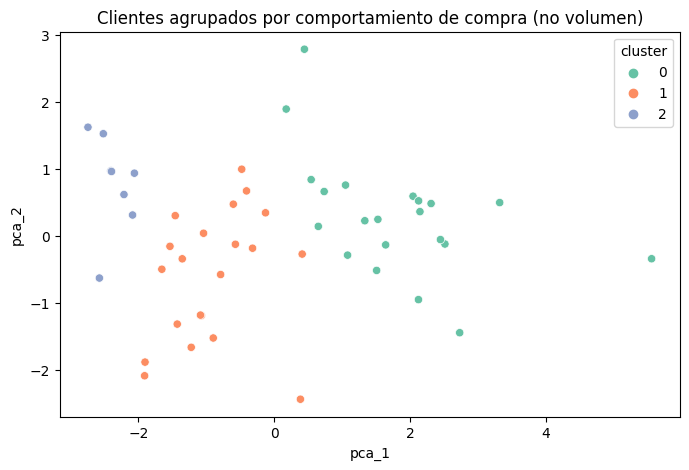

In [120]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Escalamos
X = df_clientes.drop(columns=['customer_id'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Agregamos al df
df_clientes['cluster'] = clusters
df_clientes['pca_1'] = X_pca[:, 0]
df_clientes['pca_2'] = X_pca[:, 1]

# Visualizamos
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_clientes, x='pca_1', y='pca_2', hue='cluster', palette='Set2')
plt.title('Clientes agrupados por comportamiento de compra (no volumen)')
plt.show()